In [1]:
import sys
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
# Add the parent directory to the Python path
sys.path.append(str(Path().resolve().parent))
import utils
import trainer
import evaluator
import data_process
import motion_blur

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size, img_dir=os.path.join('..', data_process.img_dir), ann_dir=os.path.join('..', data_process.ann_dir))   

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural', 'kernel_path': '../data/motion_blur_data'})

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



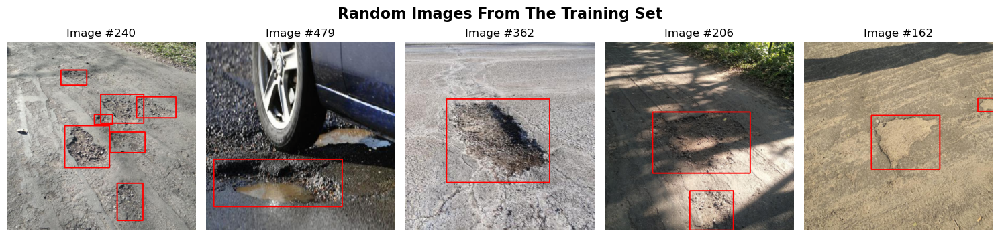

In [3]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

In [4]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="../data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/retinanet_resnet50_fpn_v2", kornia_aug=False)

Starting training for retinanet_resnet50_fpn_v2 with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00013306848141706506, 'beta1': 0.9068693027594908, 'beta2': 0.9382663514975078, 'scheduler': 'CosineAnnealingLR', 'T_max': 9, 'eta_min': 2.2865560690366153e-07}


Epoch 1/100, Train Loss: 41.7369, Val mAP@50: 0.3268, FPS: 64.56, Epoch Time: 21.01 seconds
Epoch 2/100, Train Loss: 23.7786, Val mAP@50: 0.4744, FPS: 66.13, Epoch Time: 20.86 seconds
Epoch 3/100, Train Loss: 15.1361, Val mAP@50: 0.5428, FPS: 66.70, Epoch Time: 20.92 seconds
Epoch 4/100, Train Loss: 10.8119, Val mAP@50: 0.6214, FPS: 66.64, Epoch Time: 20.97 seconds
Epoch 5/100, Train Loss: 8.1526, Val mAP@50: 0.6710, FPS: 66.75, Epoch Time: 20.94 seconds
Epoch 6/100, Train Loss: 6.3720, Val mAP@50: 0.6228, FPS: 66.72, Epoch Time: 20.94 seconds
Epoch 7/100, Train Loss: 5.1770, Val mAP@50: 0.6772, FPS: 66.61, Epoch Time: 20.99 seconds
Epoch 8/100, Train Loss: 4.2097, Val mAP@50: 0.6548, FPS: 66.86, Epoch Time: 21.00 seconds
Epoch 9/100, Train Loss: 3.7420, Val mAP@50: 0.6892, FPS: 66.71, Epoch Time: 20.93 seconds
Epoch 10/100, Train Loss: 3.6141, Val mAP@50: 0.6840, FPS: 66.77, Epoch Time: 20.92 seconds
Epoch 11/100, Train Loss: 3.6491, Val mAP@50: 0.6693, FPS: 66.76, Epoch Time: 20.91 s

Mean Average Precision @ 0.5 : 0.6188 FPS: 61.36


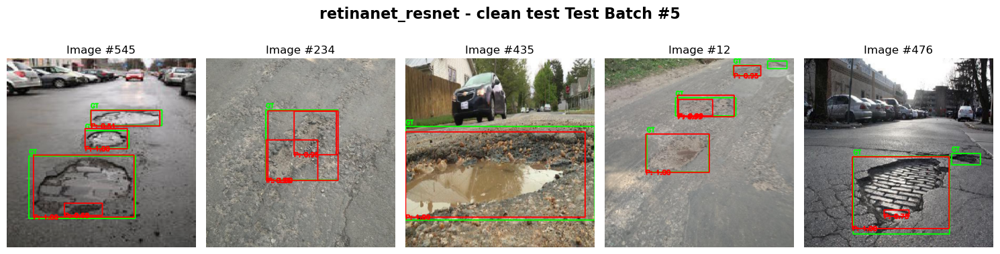

Mean Average Precision @ 0.5 : 0.4453 FPS: 61.47


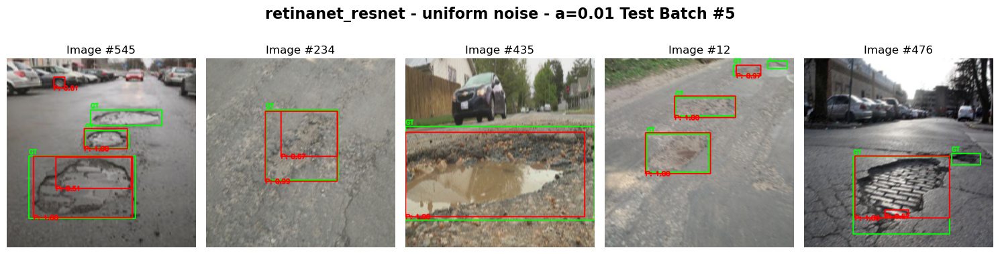

Mean Average Precision @ 0.5 : 0.0234 FPS: 63.16


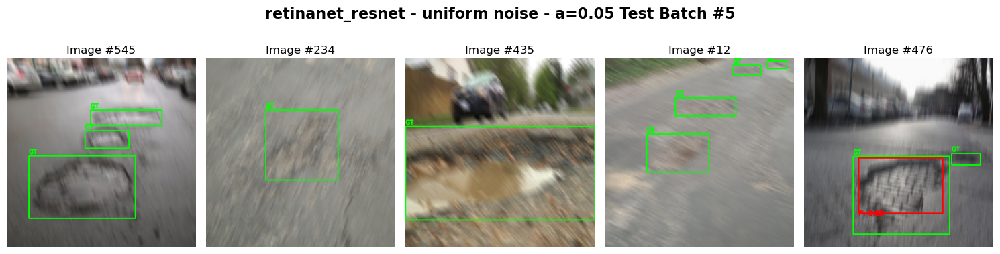

Mean Average Precision @ 0.5 : 0.0000 FPS: 63.37


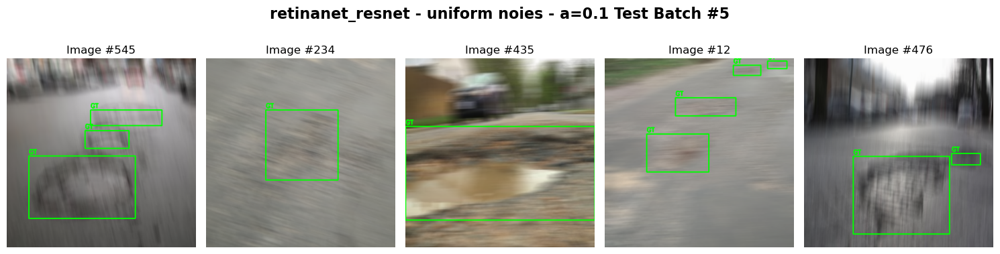

Mean Average Precision @ 0.5 : 0.4222 FPS: 61.53


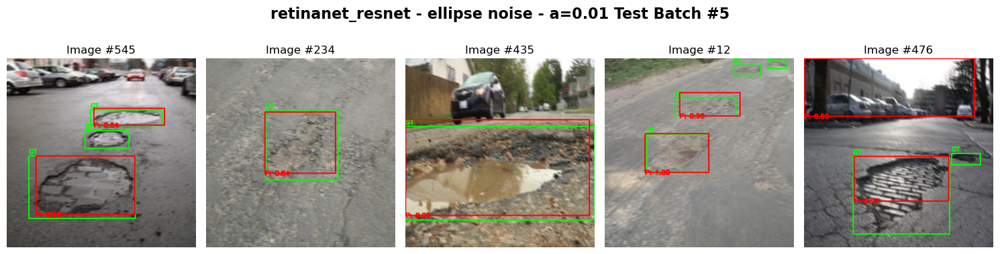

Mean Average Precision @ 0.5 : 0.0397 FPS: 63.09


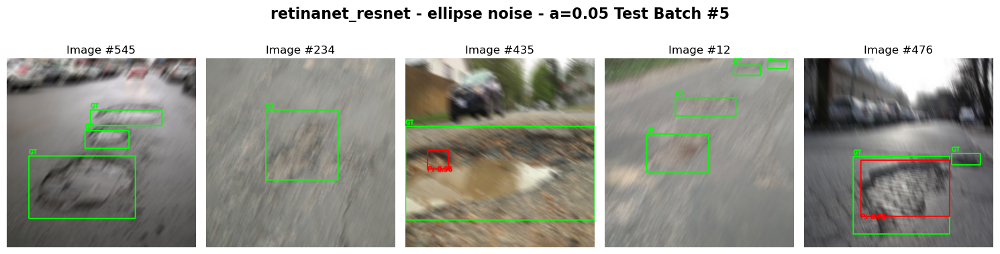

Mean Average Precision @ 0.5 : 0.0099 FPS: 63.80


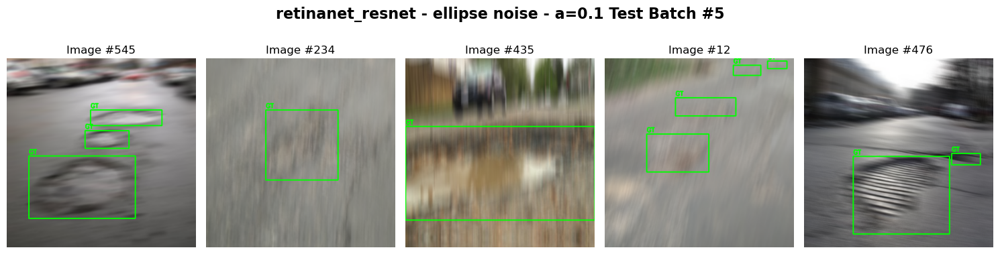

Mean Average Precision @ 0.5 : 0.3733 FPS: 61.86


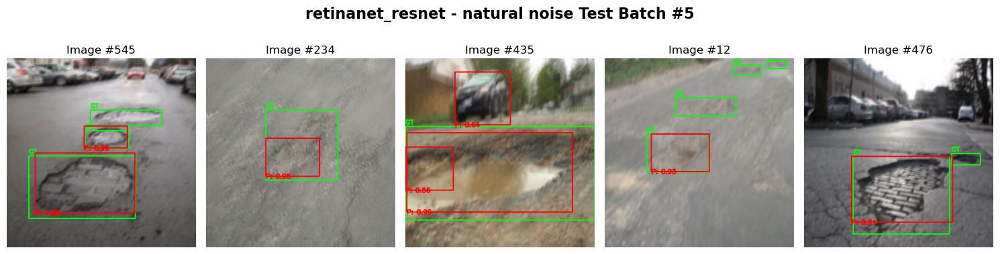

In [5]:
model_name = "retinanet_resnet50_fpn_v2"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="retinanet_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="retinanet_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="retinanet_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="retinanet_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="retinanet_resnet - natural noise")

In [6]:
# save history to .json file
utils.update_json(history, model_name="retinanet_resnet", save_path='../')

In [7]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="../data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/retinanet_resnet50_fpn_v2", kornia_aug=True)

Starting training for retinanet_resnet50_fpn_v2 with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00013306848141706506, 'beta1': 0.9068693027594908, 'beta2': 0.9382663514975078, 'scheduler': 'CosineAnnealingLR', 'T_max': 9, 'eta_min': 2.2865560690366153e-07}
Epoch 1/100, Train Loss: 46.9494, Val mAP@50: 0.2900, FPS: 65.35, Epoch Time: 20.79 seconds


Epoch 2/100, Train Loss: 31.3594, Val mAP@50: 0.4306, FPS: 65.84, Epoch Time: 20.80 seconds
Epoch 3/100, Train Loss: 26.6127, Val mAP@50: 0.5109, FPS: 65.60, Epoch Time: 20.83 seconds
Epoch 4/100, Train Loss: 23.0273, Val mAP@50: 0.6226, FPS: 65.56, Epoch Time: 20.82 seconds
Epoch 5/100, Train Loss: 19.3668, Val mAP@50: 0.5377, FPS: 65.87, Epoch Time: 20.82 seconds
Epoch 6/100, Train Loss: 18.1272, Val mAP@50: 0.6575, FPS: 65.82, Epoch Time: 20.88 seconds
Epoch 7/100, Train Loss: 16.5514, Val mAP@50: 0.6276, FPS: 65.92, Epoch Time: 20.79 seconds
Epoch 8/100, Train Loss: 16.4278, Val mAP@50: 0.6605, FPS: 65.77, Epoch Time: 20.83 seconds
Epoch 9/100, Train Loss: 15.3725, Val mAP@50: 0.6437, FPS: 65.86, Epoch Time: 20.80 seconds
Epoch 10/100, Train Loss: 13.8795, Val mAP@50: 0.6591, FPS: 65.93, Epoch Time: 20.76 seconds
Epoch 11/100, Train Loss: 14.9973, Val mAP@50: 0.6539, FPS: 65.95, Epoch Time: 20.89 seconds
Epoch 12/100, Train Loss: 13.7956, Val mAP@50: 0.6614, FPS: 66.08, Epoch Time:

{'train_losses': [46.94940096139908,
  31.359436988830566,
  26.612683191895485,
  23.02728521823883,
  19.366796031594276,
  18.127214014530182,
  16.551371067762375,
  16.42779341340065,
  15.372496530413628,
  13.879455044865608,
  14.997271694242954,
  13.79563157260418,
  15.874455407261848,
  14.836832918226719,
  14.725610107183456,
  14.497897058725357,
  13.98322869837284,
  15.269987799227238,
  14.264759987592697,
  14.28325717151165,
  13.204031318426132,
  12.420205026865005,
  10.258988231420517,
  9.409226804971695,
  10.229141786694527,
  9.187863383442163,
  8.552747171372175,
  7.7881743013858795,
  8.51880107820034,
  8.045766431838274,
  9.349903620779514,
  9.048846360296011,
  8.964497223496437,
  10.064860694110394,
  11.102426059544086,
  10.865793503820896,
  10.43134506046772,
  9.78579430282116,
  9.871371887624264,
  8.940971419215202,
  8.44211620092392,
  8.331956442445517,
  7.423068773001432,
  7.776038151234388,
  6.813179388642311,
  6.341237595304847,

Mean Average Precision @ 0.5 : 0.6444 FPS: 61.20


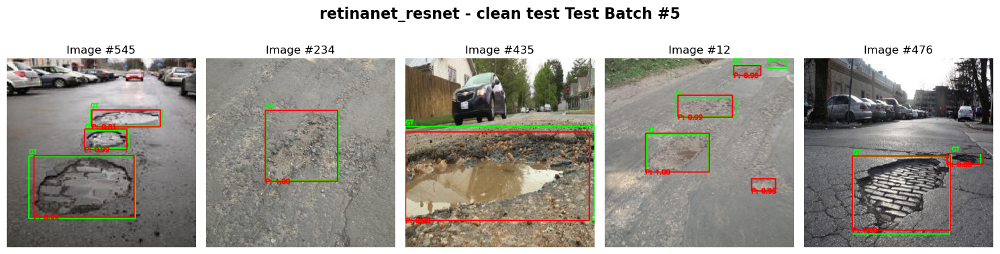

Mean Average Precision @ 0.5 : 0.5633 FPS: 60.99


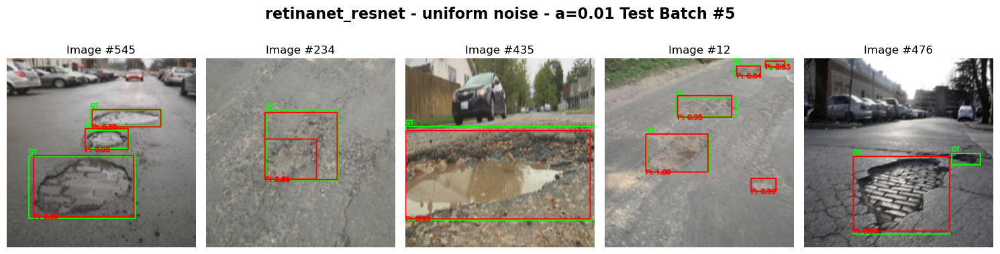

Mean Average Precision @ 0.5 : 0.4423 FPS: 60.67


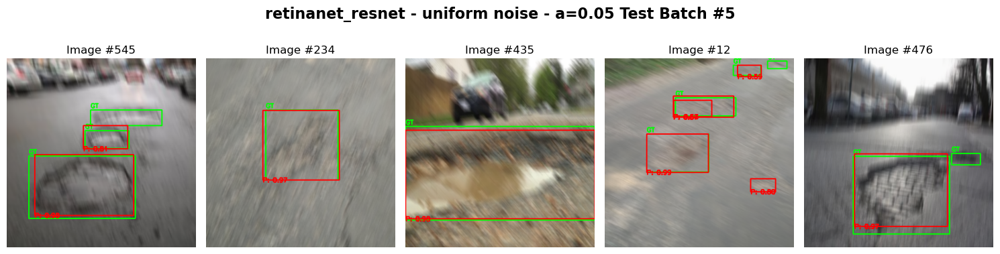

Mean Average Precision @ 0.5 : 0.3187 FPS: 60.66


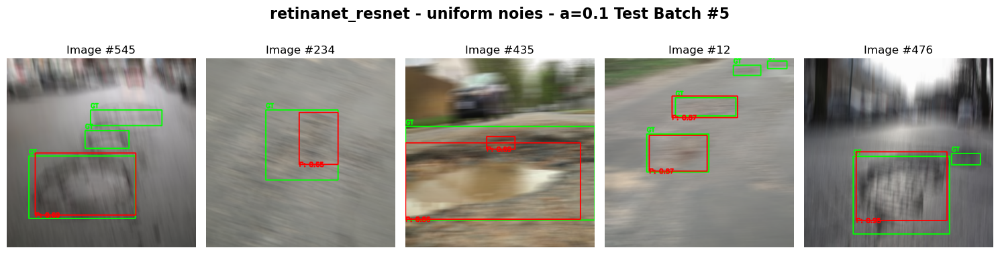

Mean Average Precision @ 0.5 : 0.5720 FPS: 60.94


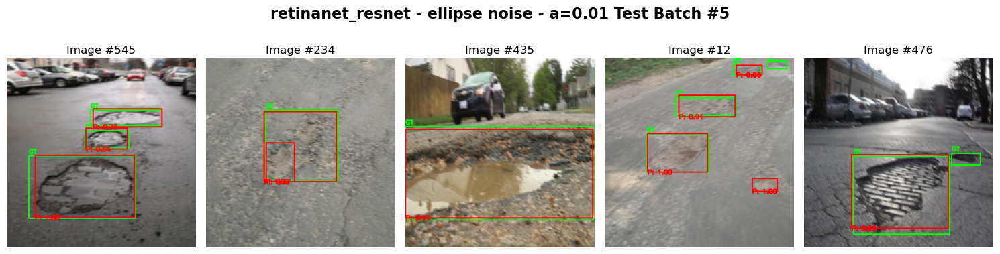

Mean Average Precision @ 0.5 : 0.4105 FPS: 60.80


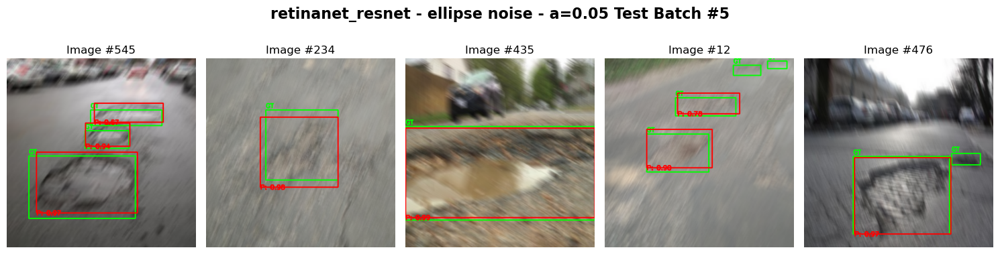

Mean Average Precision @ 0.5 : 0.2699 FPS: 60.87


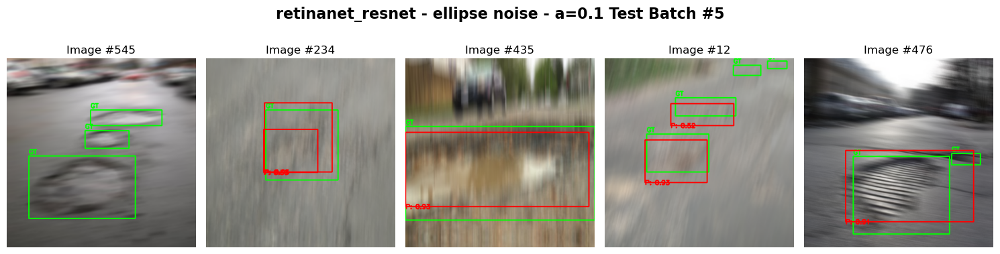

Mean Average Precision @ 0.5 : 0.5098 FPS: 61.12


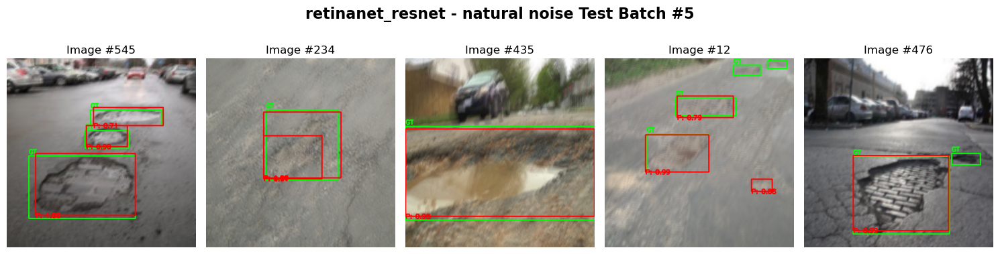

In [8]:
model_name = "retinanet_resnet50_fpn_v2"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="retinanet_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="retinanet_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="retinanet_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="retinanet_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="retinanet_resnet - natural noise")

In [9]:
# save history to .json file
utils.update_json(history, model_name="retinanet_resnet_aug", save_path='../')